This notebook uses nevergrad to roughly fit a simple epidemiological model to the COVID-19 data for the regions in Italy then runs Markov Chain Monte Carlo sampling on the initialized model using PyMC3 to find a distribution over the model parameters and predictions.

The model tracks population states corresponding to the data categories plus exposed (a pre-infectious stage) and undetected infectious. Deaths and recoveries for undetected cases are grouped together as there is nothing to distinguish them in the data or model. The susceptible category is not included here, making this model only viable when a small fraction of the population becomes infected. Given the noise in the data, this approximation should be viable up to at least 1% of the population, perhaps has high as 10%. Beyond that, the model will overestimate infection rate.

In [1]:
import theano
theano.config.gcc.cxxflags = "-Wno-c++11-narrowing"  # Silence a harmless warning

In [2]:
import pickle

import holoviews as hv
import nevergrad as ng
import numpy as np
import pandas as pd
import pymc3 as pm
import theano.tensor as tt
import xarray as xr

The model code is partially written outside this notebook for the convenience of an IDE, for better reuse, and so that Nevergrad could be run with multiprocessing for parallel execution, which requires the target function be importable. Nevergrad is used to minimize `seir.simple_eir.func` (dropping the module name hereafter), which is a wrapper around `calc_score(*ode(*transform(**kwargs)))`. The innermost function, `transform` takes the unbounded inputs and maps them to their model variables (e.g. positive only or within $[0, 1)$). Transformed values are passed to the `ode` function which runs a Euler-integrated (S)EIR model. Then the ODE outputs are scored against the data.

In [3]:
%load_ext autoreload
%autoreload 1
%aimport seir.simple_eir

Reloading!


In [4]:
hv.notebook_extension('bokeh', logo=False)

The exponential scaling of this model makes scale difficult to determine without limitations placed on undetected cases. Fortunately, the Italy data includes total tests administered. I am not aware of any standard model for the effectiveness of testing. A naive approach would be to say that individuals are tested at random and the probability of detecting a case is proportional to the number of tests administered times the number of currently undetected infectious individuals (assuming those detected are not tested again). It may also be reasonable to assume for low testing rates that the testing is targeted with some efficiency such that infectious individuals are more likely to be tested than others by some constant. Early testing with this model suggests that is not accurate for Italy, where the level of testing is sufficiently high that this model breaks down.

Instead, to model diminishing returns in testing, we model the detection rate as proportional to the square root of (smoothed) new tests administered times infectious individuals.

In [5]:
ds = seir.simple_eir.ds
x = ds['tamponi']
x = x.diff(dim='data')
hv.HoloMap({
    str(xi['denominazione_regione'].values): hv.Curve(xi, ('data', 'Date'), ('tamponi', 'Δ Tests'))
    for xi in x
}, 'Region').overlay().options(aspect=5/3, responsive=True, legend_position='right', cmap='Category20')

:NdOverlay   [Region]
   :Curve   [data]   (tamponi)

In [6]:
ds = seir.simple_eir.ds
new_tests = ds['tamponi'].rolling({'data': 7}, center=False, min_periods=1).mean()
new_tests = new_tests.diff(dim='data') + 1
sqrt_new_tests = np.sqrt(new_tests)
hv.HoloMap({
    str(xi['denominazione_regione'].values): hv.Curve(xi, 'data', 'tamponi')
    for xi in sqrt_new_tests
}, 'Region').overlay().options(aspect=5/3, responsive=True, logy=True, legend_position='right')

:NdOverlay   [Region]
   :Curve   [data]   (tamponi)

In [8]:
ds = seir.simple_eir.ds
x = ds['tamponi'].rolling({'data': 7}, center=False, min_periods=1).mean()
x = x.diff(dim='data') + 1
x = ds['nuovi_positivi'] / np.sqrt(x) * ds['totale_positivi']
x.name = 'new_per_test'
hv.HoloMap({
    str(xi['denominazione_regione'].values): hv.Scatter(xi, 'data', 'new_per_test')
    for xi in x
}, 'Region').overlay().options(aspect=5/3, responsive=True, logy=True, legend_position='right'
                              ).redim.range(new_per_test=(1e-4, None))

:NdOverlay   [Region]
   :Scatter   [data]   (new_per_test)

Nevergrad is run outside this notebook and temporary and the final parameter sets are saved in a pickle file. Below, they are loaded to be used for PyMC3 model initialization.

In [380]:
with open('seir/tmp_best.pkl', 'rb') as f:
    kwargs = pickle.load(f)

print(seir.simple_eir.transform(**{k: np.average(v) for k, v in kwargs.items()}))
print([(np.min(v), np.average(v), np.max(v)) for v in seir.simple_eir.transform(**kwargs)])
print(seir.simple_eir.func(**kwargs))

exposed, infectious, detected, recovered, dead = seir.simple_eir.ode(
    *seir.simple_eir.transform(**kwargs)
)

# Holoviews handles NaN better than inf
exposed[np.isinf(exposed)] = np.nan
infectious[np.isinf(infectious)] = np.nan
detected[np.isinf(detected)] = np.nan
recovered[np.isinf(recovered)] = np.nan
dead[np.isinf(dead)] = np.nan

# Plot a few regions in linear scale for an initial look at the model fit
hv.HoloMap({
    (region, variable):
    hv.Curve((seir.simple_eir.ds['data'].values, data[region_i, :]), 'Date', 'Count', label='exposed')
    * (hv.Scatter(seir.simple_eir.ds.isel(denominazione_regione=region_i), 'data', ds_name)
       if ds_name is not None else hv.Scatter(([], [])))
    for region_i, region in ((seir.simple_eir.region_names.index(region), region)
                             for region in ['Lombardia', 'Veneto'])
    for variable, data, ds_name in [
        ('exposed', exposed, None),
        ('infectious', infectious, None),
        ('detected', detected, 'totale_positivi'),
        ('recovered', recovered, 'dimessi_guariti'),
        ('dead', dead, 'deceduti'),
    ]
}, ['Region', 'Variable']).overlay('Variable').options(aspect=3, responsive=True).layout().cols(1)

(509.81463453099155, 1.1596308867622514e-13, inf, 0.0, 0.06756947353257567, 0.1696435257027802, 0.4592853988808284, 0.025210204618041267, 0.009608767218591475, 0.9991783274103102)
[(0.13143218417033073, 57903.098930840206, 887197.3158968989), (1.6140511519719837e-213, 609.6810052901774, 4834.8270742637305), (0.0, inf, inf), (0.0, 0.47058823529411764, 1.0), (0.06756947353257567, 0.06756947353257567, 0.06756947353257567), (0.00021567399789575086, 1.1524598749612256, 6.07898667888739), (0.4592853988808284, 0.4592853988808284, 0.4592853988808284), (0.025210204618041267, 0.025210204618041267, 0.025210204618041267), (0.00522192882764356, 0.010517729510693314, 0.02065147942944867), (0.500000002812411, 0.8002541599652909, 0.9999999999856526)]
44182.672052741895


:NdLayout   [Region]
   :NdOverlay   [Variable]
      :Overlay
         .Curve.Exposed :Curve   [Date]   (Count)
         .Scatter.I     :Scatter   [data]   (dimessi_guariti)

In [381]:
# Plot the nevergrad fit for all regions on log scale
(
    hv.HoloMap({
        (seir.simple_eir.region_names[region_i], variable):
        hv.Curve((seir.simple_eir.ds['data'].values, data[region_i, :]), 'Date', 'Count', label='exposed')
        * (hv.Scatter(seir.simple_eir.ds.isel(denominazione_regione=region_i), 'data', ds_name)
           if ds_name is not None else hv.Scatter(([], [])))
        for region_i in range(seir.simple_eir.n_regions)
        for variable, data, ds_name in [
            ('exposed', exposed, None),
            ('infectious', infectious, None),
            ('detected', detected, 'totale_positivi'),
            ('recovered', recovered, 'dimessi_guariti'),
            ('dead', dead, 'deceduti'),
        ]
    }, ['Region', 'Variable']).overlay('Variable')
    .options(aspect=3, responsive=True, legend_position='right', logy=True)
    .redim.range(Count=(0.1, None))
    .layout().cols(1)
)

:NdLayout   [Region]
   :NdOverlay   [Variable]
      :Overlay
         .Curve.Exposed :Curve   [Date]   (Count)
         .Scatter.I     :Scatter   [data]   (dimessi_guariti)

In [383]:
# Calculate the transformed parameters and ODE trace

(initial_exposed, initial_infectious, beta, beta_detected_ratio,
 sigma, theta, gamma_mu, gamma_detected, mu_detected, mu_ratio) = seir.simple_eir.transform(**kwargs)

beta = beta[:, :-1]
beta_detected_ratio = beta_detected_ratio[:, :-1]
mu_ratio = mu_ratio[:-1]

exposed, infectious, detected, recovered, dead = seir.simple_eir.ode(
    initial_exposed, initial_infectious, beta, beta_detected_ratio,
    sigma, theta, gamma_mu, gamma_detected, mu_detected, mu_ratio
)

assert np.all(np.isfinite(exposed))
assert np.all(np.isfinite(infectious))
assert np.all(np.isfinite(detected))
assert np.all(np.isfinite(recovered))
assert np.all(np.isfinite(dead))

assert not np.any(np.isnan(infectious))
assert not np.any(np.isnan(infectious))
assert not np.any(np.isnan(detected))
assert not np.any(np.isnan(recovered))
assert not np.any(np.isnan(dead))

x = theta
print(x.min(), x.mean(), x.max())
x = (theta * seir.simple_eir.sqrt_new_tests / 1e2)
print(x.min(), x.mean(), x.max())
x = beta_detected_ratio
print(x.min(), x.mean(), x.max())
x = beta_detected_ratio * (1 - 2e-4) + 1e-4
print(x.min(), x.mean(), x.max())

0.00021567399789575086 1.1524598749612256 6.07898667888739
1.6706036041204334e-06 0.6180005218402445 6.816512655461761
0.0 0.4470588235294118 1.0
0.0001 0.4470694117647059 0.9999


Below, we create the PyMC3 model. This model is a Stochastic differential equation (SDE). It defines the timeseries as noisy latent variables then computes the predicted next time step for every time step. The model is then constrained with an observed variable pushing the predictions and the latent values together.

In [384]:
n_regions = seir.simple_eir.n_regions
n_time = seir.simple_eir.n_time

SD = 3

with pm.Model() as model:
    
    noise = pm.Normal('exposed_noise', 0, 1, shape=(n_regions, n_time))
    mu = exposed
    sd = np.sqrt(100 ** 2 + 0.30 ** 2 * mu * mu)
    exposed = pm.Deterministic('exposed', pm.math.maximum(0, mu + sd * noise))
    
    noise = pm.Normal('infectious_noise', 0, 1, shape=(n_regions, n_time))
    mu = infectious
    sd = np.sqrt(100 ** 2 + 0.30 ** 2 * mu * mu)
    infectious = pm.Deterministic('infectious', pm.math.maximum(0, mu + sd * noise))
    
    noise = pm.Normal('detected_noise', 0, 1, shape=(n_regions, n_time))
    mu = seir.simple_eir.ds['totale_positivi'].values
    sd = np.sqrt(20 ** 2 + 0.15 ** 2 * mu * mu)
    detected = pm.Deterministic('detected', pm.math.maximum(0, mu + sd * noise))
    
    noise = pm.Normal('recovered_noise', 0, 1, shape=(n_regions, n_time))
    mu = seir.simple_eir.ds['dimessi_guariti'].values
    sd = np.sqrt(40 ** 2 + 0.20 ** 2 * mu * mu)
    recovered = pm.Deterministic('recovered', pm.math.maximum(0, mu + sd * noise))
    
    noise = pm.Normal('dead_noise', 0, 1, shape=(n_regions, n_time))
    mu = seir.simple_eir.ds['deceduti'].values
    sd = np.sqrt(10 ** 2 + 0.10 ** 2 * mu * mu)
    dead = pm.Deterministic('dead', pm.math.maximum(0, mu + sd * noise))
    
    beta = pm.Lognormal(
        name='beta',
        mu=np.log(np.maximum(1e-4, beta)),
        sd=SD,
        shape=(n_regions, seir.simple_eir.n_eras),
    )[..., seir.simple_eir.era_indices[:-1]]
    beta_detected_ratio = pm.Uniform(
        name='beta_detected_ratio',
        lower=0,
        upper=1,
        testval=beta_detected_ratio * (1 - 2e-4) + 1e-4,
        shape=(n_regions, seir.simple_eir.n_eras),
    )[..., seir.simple_eir.era_indices[:-1]]
    sigma = pm.Lognormal(
        name='sigma',
#         mu=np.log(0.3),
        mu=np.log(sigma),
        sd=SD,
    )
    theta = pm.math.minimum(0.95, pm.Lognormal(
        name='theta',
        mu=np.log(theta),
        sd=SD,
        shape=(n_regions, 1),
    ) * seir.simple_eir.sqrt_new_tests / 1e2)
    gamma_mu = pm.Lognormal(
        name='gamma_mu',
#         mu=np.log(0.35),
        mu=np.log(gamma_mu),
        sd=SD,
    )
    gamma_detected = pm.Lognormal(
        name='gamma_detected',
#         mu=np.log(0.008),
        mu=np.log(gamma_detected),
        sd=SD,
    )
    mu_detected = pm.Lognormal(
        name='mu_detected',
#         mu=np.log(0.005),
        mu=np.log(mu_detected),
        sd=SD,
        shape=n_regions,
    )
    mu_ratio = pm.math.concatenate([
        np.ones(1),
        pm.Uniform(
            name='mu_ratio',
            lower=0.5,
            upper=1,
            testval=mu_ratio,
            shape=seir.simple_eir.n_eras-1,
        )
    ])[..., seir.simple_eir.era_indices[:-1]]
    
    exposed0, exposed1 = exposed[:, :-1], exposed[:, 1:]
    infectious0, infectious1 = infectious[:, :-1], infectious[:, 1:]
    detected0, detected1 = detected[:, :-1], detected[:, 1:]
    recovered0, recovered1 = recovered[:, :-1], recovered[:, 1:]
    dead0, dead1 = dead[:, :-1], dead[:, 1:]
    
    newly_exposed = beta * infectious0 + beta * beta_detected_ratio * detected0
    progressed = sigma * exposed0
    detections = theta * infectious0
    recoveries_detected = gamma_detected * detected0
    deaths_detected = mu_ratio[None, :] * mu_detected[:, None] * detected0
    
    exposed2 = exposed0 + newly_exposed - progressed
    infectious2 = infectious0 + progressed - detections - gamma_mu * infectious0
    detected2 = detected0 + detections - recoveries_detected - deaths_detected
    recovered2 = recovered0 + recoveries_detected
    dead2 = dead0 + deaths_detected
    
    def sde_potential(name, y1, y2):
        sd = np.sqrt(((8.0 ** 2) + (0.04 ** 2 * y2 * y2)))
        mu = pm.Deterministic(f'innovation_{name}', (y1-y2)/sd)
        pm.Normal(f'sde_{name}', mu=mu, sd=1, observed=0)
#         pm.Normal(f'sde_{name}', mu=y1-y2, sd=sd, observed=0)
    
    sde_potential('exposed', exposed1, exposed2)
    sde_potential('infectious', infectious1, infectious2)
    sde_potential('detected', detected1, detected2)
    sde_potential('recovered', recovered1, recovered2)
    sde_potential('dead', dead1, dead2)


Before sampling, let's do a sanity check on the model values.

In [385]:
# Create a function to evaluate a model variable using the latent variable initial values
defaults = {str(v): v.init_value for v in model.vars}
def f(x):
    return theano.function(model.vars, x, on_unused_input='ignore')(**defaults)

In [386]:
# Which regions have NaNs in these variables?
{str(x): list(np.asarray(seir.simple_eir.region_names)[np.isnan(f(x)).any(axis=1)]) for x in model.deterministics[:5]}

{'exposed': [], 'infectious': [], 'detected': [], 'recovered': [], 'dead': []}

In [387]:
# Which regions have NaNs in these variables?
{str(x): list(np.asarray(seir.simple_eir.region_names)[np.isnan(f(x)).any(axis=1)]) for x in model.deterministics[-5:]}

{'innovation_exposed': [],
 'innovation_infectious': [],
 'innovation_detected': [],
 'innovation_recovered': [],
 'innovation_dead': []}

In [388]:
# Are there any NaNs in our parameters?
{str(x): np.isnan(f(x)).any() for x in model.deterministics[5:-5]}

{'beta': False,
 'beta_detected_ratio': False,
 'sigma': False,
 'theta': False,
 'gamma_mu': False,
 'gamma_detected': False,
 'mu_detected': False,
 'mu_ratio': False}

In [389]:
# Are any logp values NaN, Inf, or really small?
{x: f(x.logpt) for x in model.vars}

{exposed_noise: array(-1765.28092229),
 infectious_noise: array(-1765.28092229),
 detected_noise: array(-1765.28092229),
 recovered_noise: array(-1765.28092229),
 dead_noise: array(-1765.28092229),
 beta_log__: array(-171.49181986),
 beta_detected_ratio_interval__: array(-782.88743204),
 sigma_log__: array(-2.01755082),
 theta_log__: array(-34.29836397),
 gamma_mu_log__: array(-2.01755082),
 gamma_detected_log__: array(-2.01755082),
 mu_detected_log__: array(-34.29836397),
 mu_ratio_interval__: array(-58.98674856)}

To visualize the SDE model fit, the following plot shows a line segment from every point in the timeseries to the predicted point next. When that predicted point is close to the actual next point the line appears smooth. When there is variation, you see a saw-tooth pattern.

In [390]:
hv.HoloMap({
    (region, varname): hv.Curve((
        np.stack([
            seir.simple_eir.ds['data'].values[None, :-1],
            seir.simple_eir.ds['data'].values[None, 1:],
            seir.simple_eir.ds['data'].values[None, :-1],
        ], axis=-1).ravel(),
        np.stack([
            x0[None, region_i, :],
            x1[None, region_i, :],
            np.nan * x0[None, region_i, :],
        ], axis=-1).ravel(),
    ), 'Date', varname)
    .options(alpha=0.4)
    for region_i, region in ((seir.simple_eir.region_names.index(region), region)
                             for region in [
                                 'Abruzzo',
                                 'Lombardia',
                                 'Veneto',
                             ])
    for varname, x0, x1 in [
        ('Exposed', f(exposed0), f(exposed2)),
        ('Infectious', f(infectious0), f(infectious2)),
        ('Detected', f(detected0), f(detected2)),
        ('Recovered', f(recovered0), f(recovered2)),
        ('Dead', f(dead0), f(dead2)),
    ]
}, ['Region', 'Variable']).overlay('Region').options(aspect=3, responsive=True).layout().cols(1)

:NdLayout   [Variable]
   :NdOverlay   [Region]
      :Curve   [Date]   (Recovered)

Another view of the same information, the following plot shows the "innovation" or the difference between the input next point and the SDE predicted next point scaled by the modeled SDE noise level.

In [391]:
hv.HoloMap({
    (region, varname): hv.Curve((
        seir.simple_eir.ds['data'].values[None, :-1],
        x0[None, region_i, :],
    ), 'Date', varname)
    .options(alpha=0.4)
    for region_i, region in ((seir.simple_eir.region_names.index(region), region)
                             for region in [
                                 'Abruzzo',
                                 'Lombardia',
                                 'Veneto',
                             ])
    for varname, x0 in [
        ('Exposed', f(model.deterministics[-5])),
        ('Infectious', f(model.deterministics[-4])),
        ('Detected', f(model.deterministics[-3])),
        ('Recovered', f(model.deterministics[-2])),
        ('Dead', f(model.deterministics[-1])),
    ]
}, ['Region', 'Variable']).overlay('Region').options(aspect=3, responsive=True).layout().cols(1)

:NdLayout   [Variable]
   :NdOverlay   [Region]
      :Curve   [Date]   (Recovered)

In [394]:
with model:
    trace = pm.sample(1_000, tune=1_000, target_accept=0.99, compute_convergence_checks=False)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_ratio, mu_detected, gamma_detected, gamma_mu, theta, sigma, beta_detected_ratio, beta, dead_noise, recovered_noise, detected_noise, infectious_noise, exposed_noise]
Sampling 4 chains, 0 divergences: 100%|██████████| 8000/8000 [1:14:13<00:00,  1.80draws/s]
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f8f66d8b160>,
      dtype=object)

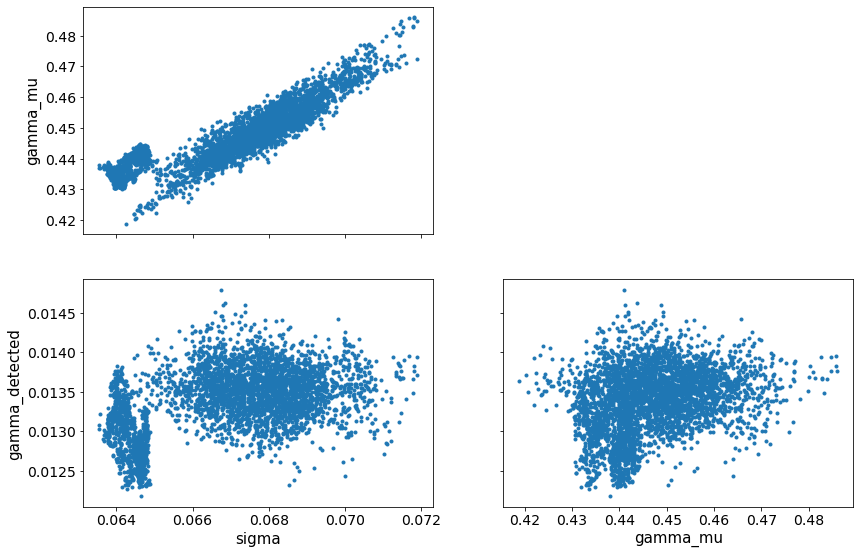

In [395]:
pm.pairplot(trace, var_names=[
    # 'beta_detected_ratio',
    'sigma',
    #'theta',
    'gamma_mu',
    'gamma_detected',
    #'mu_detected',
], divergences=True)

In [396]:
k = 64
i = np.random.randint(len(trace) * trace.nchains, size=k)

In [397]:
t = np.repeat(seir.simple_eir.ds['data'].values[None, :-1], k, 0).ravel()

hv.HoloMap({
    (seir.simple_eir.region_names[region_i], group):
    hv.Scatter((t, trace[f'innovation_{group}'][i, region_i, :].ravel()), 'Date', 'Deviation from SEIR model')
    .options(alpha=0.1, color=color)
    for region_i, color, linecolor in [
        (7, 'blue', 'white'),
        (16, 'red', 'black'),
        (0, 'green', 'yellow'),
    ]
    for group in [
        'exposed',
        'infectious',
        'detected',
        'recovered',
        'dead',
    ]
}, ['Region', 'Variable']).overlay('Region').options(aspect=2, responsive=True).layout().cols(1)

:NdLayout   [Variable]
   :NdOverlay   [Region]
      :Scatter   [Date]   (Deviation from SEIR model)

In [398]:
hv.HoloMap({
    seir.simple_eir.region_names[region_i]: (
        hv.Overlay([
            hv.Curve((
                seir.simple_eir.ds['data'], 
                trace['detected'][k, region_i, :] +
                trace['recovered'][k, region_i, :] +
                trace['dead'][k, region_i, :]
            ), 'Date', 'Total Detected Cases')
            .options(alpha=0.1, color=color)
            for k in i
        ])
        *
        hv.Scatter((seir.simple_eir.ds['data'], seir.simple_eir.ds['totale_casi'][region_i]))
        .options(color=color, line_color=linecolor, alpha=0.2)
    )
    for region_i, color, linecolor in [
        (7, 'blue', 'white'),
        (16, 'red', 'black'),
        (0, 'green', 'yellow'),
    ]
}, ['Region']).overlay().options(aspect=5/3, responsive=True)

:NdOverlay   [Region]
   :Overlay
      .Curve.I       :Curve   [Date]   (Total Detected Cases)
      .Curve.II      :Curve   [Date]   (Total Detected Cases)
      .Curve.III     :Curve   [Date]   (Total Detected Cases)
      .Curve.IV      :Curve   [Date]   (Total Detected Cases)
      .Curve.V       :Curve   [Date]   (Total Detected Cases)
      .Curve.VI      :Curve   [Date]   (Total Detected Cases)
      .Curve.VII     :Curve   [Date]   (Total Detected Cases)
      .Curve.VIII    :Curve   [Date]   (Total Detected Cases)
      .Curve.IX      :Curve   [Date]   (Total Detected Cases)
      .Curve.X       :Curve   [Date]   (Total Detected Cases)
      .Curve.XI      :Curve   [Date]   (Total Detected Cases)
      .Curve.XII     :Curve   [Date]   (Total Detected Cases)
      .Curve.XIII    :Curve   [Date]   (Total Detected Cases)
      .Curve.XIV     :Curve   [Date]   (Total Detected Cases)
      .Curve.XV      :Curve   [Date]   (Total Detected Cases)
      .Curve.XVI     :Curve   [Date]   (Total Detected Cases)
      .Curve.XVII    :Curve   [Date]   (Total Detected Cases)
      .Curve.XVIII   :Curve   [Date]   (Total Detected Cases)
      .Curve.XIX     :Curve   [Date]   (Total Detected Cases)
      .Curve.XX      :Curve   [Date]   (Total Detected Cases)
      .Curve.XXI     :Curve   [Date]   (Total Detected Cases)
      .Curve.XXII    :Curve   [Date]   (Total Detected Cases)
      .Curve.XXIII   :Curve   [Date]   (Total Detected Cases)
      .Curve.XXIV    :Curve   [Date]   (Total Detected Cases)
      .Curve.XXV     :Curve   [Date]   (Total Detected Cases)
      .Curve.XXVI    :Curve   [Date]   (Total Detected Cases)
      .Curve.XXVII   :Curve   [Date]   (Total Detected Cases)
      .Curve.XXVIII  :Curve   [Date]   (Total Detected Cases)
      .Curve.XXIX    :Curve   [Date]   (Total Detected Cases)
      .Curve.XXX     :Curve   [Date]   (Total Detected Cases)
      .Curve.XXXI    :Curve   [Date]   (Total Detected Cases)
      .Curve.XXXII   :Curve   [Date]   (Total Detected Cases)
      .Curve.XXXIII  :Curve   [Date]   (Total Detected Cases)
      .Curve.XXXIV   :Curve   [Date]   (Total Detected Cases)
      .Curve.XXXV    :Curve   [Date]   (Total Detected Cases)
      .Curve.XXXVI   :Curve   [Date]   (Total Detected Cases)
      .Curve.XXXVII  :Curve   [Date]   (Total Detected Cases)
      .Curve.XXXVIII :Curve   [Date]   (Total Detected Cases)
      .Curve.XXXIX   :Curve   [Date]   (Total Detected Cases)
      .Curve.XL      :Curve   [Date]   (Total Detected Cases)
      .Curve.XLI     :Curve   [Date]   (Total Detected Cases)
      .Curve.XLII    :Curve   [Date]   (Total Detected Cases)
      .Curve.XLIII   :Curve   [Date]   (Total Detected Cases)
      .Curve.XLIV    :Curve   [Date]   (Total Detected Cases)
      .Curve.XLV     :Curve   [Date]   (Total Detected Cases)
      .Curve.XLVI    :Curve   [Date]   (Total Detected Cases)
      .Curve.XLVII   :Curve   [Date]   (Total Detected Cases)
      .Curve.XLVIII  :Curve   [Date]   (Total Detected Cases)
      .Curve.XLIX    :Curve   [Date]   (Total Detected Cases)
      .Curve.L       :Curve   [Date]   (Total Detected Cases)
      .Curve.LI      :Curve   [Date]   (Total Detected Cases)
      .Curve.LII     :Curve   [Date]   (Total Detected Cases)
      .Curve.LIII    :Curve   [Date]   (Total Detected Cases)
      .Curve.LIV     :Curve   [Date]   (Total Detected Cases)
      .Curve.LV      :Curve   [Date]   (Total Detected Cases)
      .Curve.LVI     :Curve   [Date]   (Total Detected Cases)
      .Curve.LVII    :Curve   [Date]   (Total Detected Cases)
      .Curve.LVIII   :Curve   [Date]   (Total Detected Cases)
      .Curve.LIX     :Curve   [Date]   (Total Detected Cases)
      .Curve.LX      :Curve   [Date]   (Total Detected Cases)
      .Curve.LXI     :Curve   [Date]   (Total Detected Cases)
      .Curve.LXII    :Curve   [Date]   (Total Detected Cases)
      .Curve.LXIII   :Curve   [Date]   (Total Detected Cases)
      .Curve.LXIV    :Curve   [Date]   (Total Detected Cases

In [399]:
hv.HoloMap({
    (ylabel, seir.simple_eir.region_names[region_i]): (
        hv.Overlay([
            hv.Curve((seir.simple_eir.ds['data'], trace[tracename][k, region_i, :]), 'Date', ylabel)
            .options(alpha=0.1, color=color)
            for k in i
        ])
        *
        hv.Scatter((seir.simple_eir.ds['data'], seir.simple_eir.ds[dsname][region_i]))
        .options(color=color, line_color=linecolor, alpha=0.2)
    )
    for tracename, ylabel, dsname in [
        ('detected', 'Detected Cases', 'totale_positivi'),
        ('recovered', 'Recovered Cases', 'dimessi_guariti'),
        ('dead', 'Deaths', 'deceduti'),
    ]
    for region_i, color, linecolor in [
        (7, 'blue', 'white'),
        (16, 'red', 'black'),
        (0, 'green', 'yellow'),
    ]
}, ['Variable', 'Region']).overlay('Region').options(aspect=3, responsive=True).layout().cols(1)

:NdLayout   [Variable]
   :NdOverlay   [Region]
      :Overlay
         .Curve.I       :Curve   [Date]   (Recovered Cases)
         .Curve.II      :Curve   [Date]   (Recovered Cases)
         .Curve.III     :Curve   [Date]   (Recovered Cases)
         .Curve.IV      :Curve   [Date]   (Recovered Cases)
         .Curve.V       :Curve   [Date]   (Recovered Cases)
         .Curve.VI      :Curve   [Date]   (Recovered Cases)
         .Curve.VII     :Curve   [Date]   (Recovered Cases)
         .Curve.VIII    :Curve   [Date]   (Recovered Cases)
         .Curve.IX      :Curve   [Date]   (Recovered Cases)
         .Curve.X       :Curve   [Date]   (Recovered Cases)
         .Curve.XI      :Curve   [Date]   (Recovered Cases)
         .Curve.XII     :Curve   [Date]   (Recovered Cases)
         .Curve.XIII    :Curve   [Date]   (Recovered Cases)
         .Curve.XIV     :Curve   [Date]   (Recovered Cases)
         .Curve.XV      :Curve   [Date]   (Recovered Cases)
         .Curve.XVI     :Curve   [Date]   (Recovered Cases)
         .Curve.XVII    :Curve   [Date]   (Recovered Cases)
         .Curve.XVIII   :Curve   [Date]   (Recovered Cases)
         .Curve.XIX     :Curve   [Date]   (Recovered Cases)
         .Curve.XX      :Curve   [Date]   (Recovered Cases)
         .Curve.XXI     :Curve   [Date]   (Recovered Cases)
         .Curve.XXII    :Curve   [Date]   (Recovered Cases)
         .Curve.XXIII   :Curve   [Date]   (Recovered Cases)
         .Curve.XXIV    :Curve   [Date]   (Recovered Cases)
         .Curve.XXV     :Curve   [Date]   (Recovered Cases)
         .Curve.XXVI    :Curve   [Date]   (Recovered Cases)
         .Curve.XXVII   :Curve   [Date]   (Recovered Cases)
         .Curve.XXVIII  :Curve   [Date]   (Recovered Cases)
         .Curve.XXIX    :Curve   [Date]   (Recovered Cases)
         .Curve.XXX     :Curve   [Date]   (Recovered Cases)
         .Curve.XXXI    :Curve   [Date]   (Recovered Cases)
         .Curve.XXXII   :Curve   [Date]   (Recovered Cases)
         .Curve.XXXIII  :Curve   [Date]   (Recovered Cases)
         .Curve.XXXIV   :Curve   [Date]   (Recovered Cases)
         .Curve.XXXV    :Curve   [Date]   (Recovered Cases)
         .Curve.XXXVI   :Curve   [Date]   (Recovered Cases)
         .Curve.XXXVII  :Curve   [Date]   (Recovered Cases)
         .Curve.XXXVIII :Curve   [Date]   (Recovered Cases)
         .Curve.XXXIX   :Curve   [Date]   (Recovered Cases)
         .Curve.XL      :Curve   [Date]   (Recovered Cases)
         .Curve.XLI     :Curve   [Date]   (Recovered Cases)
         .Curve.XLII    :Curve   [Date]   (Recovered Cases)
         .Curve.XLIII   :Curve   [Date]   (Recovered Cases)
         .Curve.XLIV    :Curve   [Date]   (Recovered Cases)
         .Curve.XLV     :Curve   [Date]   (Recovered Cases)
         .Curve.XLVI    :Curve   [Date]   (Recovered Cases)
         .Curve.XLVII   :Curve   [Date]   (Recovered Cases)
         .Curve.XLVIII  :Curve   [Date]   (Recovered Cases)
         .Curve.XLIX    :Curve   [Date]   (Recovered Cases)
         .Curve.L       :Curve   [Date]   (Recovered Cases)
         .Curve.LI      :Curve   [Date]   (Recovered Cases)
         .Curve.LII     :Curve   [Date]   (Recovered Cases)
         .Curve.LIII    :Curve   [Date]   (Recovered Cases)
         .Curve.LIV     :Curve   [Date]   (Recovered Cases)
         .Curve.LV      :Curve   [Date]   (Recovered Cases)
         .Curve.LVI     :Curve   [Date]   (Recovered Cases)
         .Curve.LVII    :Curve   [Date]   (Recovered Cases)
         .Curve.LVIII   :Curve   [Date]   (Recovered Cases)
         .Curve.LIX     :Curve   [Date]   (Recovered Cases)
         .Curve.LX      :Curve   [Date]   (Recovered Cases)
         .Curve.LXI     :Curve   [Date]   (Recovered Cases)
         .Curve.LXII    :Curve   [Date]   (Recovered Cases)
         .Curve.LXIII   :Curve   [Date]   (Recovered Cases)
         .Curve.LXIV    :Curve   [Date]   (Recovered Cases)
         .Scatter.I     :Scatter   [x]   (y)

In [400]:
hv.HoloMap({
    (ylabel, seir.simple_eir.region_names[region_i]): (
        hv.Overlay([
            hv.Curve((seir.simple_eir.ds['data'], trace[tracename][k, region_i, :]), 'Date', ylabel)
            .options(alpha=0.1, color=color)
            for k in i
        ])
    )
    for tracename, ylabel in [
        ('exposed', 'Exposed'),
        ('infectious', 'Infectious'),
    ]
    for region_i, color, linecolor in [
        (7, 'blue', 'white'),
        (16, 'red', 'black'),
        (0, 'green', 'yellow'),
    ]
}, ['Variable', 'Region']).overlay('Region').options(aspect=3, responsive=True).layout().cols(1)

:NdLayout   [Variable]
   :NdOverlay   [Region]
      :Overlay
         .Curve.I       :Curve   [Date]   (Infectious)
         .Curve.II      :Curve   [Date]   (Infectious)
         .Curve.III     :Curve   [Date]   (Infectious)
         .Curve.IV      :Curve   [Date]   (Infectious)
         .Curve.V       :Curve   [Date]   (Infectious)
         .Curve.VI      :Curve   [Date]   (Infectious)
         .Curve.VII     :Curve   [Date]   (Infectious)
         .Curve.VIII    :Curve   [Date]   (Infectious)
         .Curve.IX      :Curve   [Date]   (Infectious)
         .Curve.X       :Curve   [Date]   (Infectious)
         .Curve.XI      :Curve   [Date]   (Infectious)
         .Curve.XII     :Curve   [Date]   (Infectious)
         .Curve.XIII    :Curve   [Date]   (Infectious)
         .Curve.XIV     :Curve   [Date]   (Infectious)
         .Curve.XV      :Curve   [Date]   (Infectious)
         .Curve.XVI     :Curve   [Date]   (Infectious)
         .Curve.XVII    :Curve   [Date]   (Infectious)
         .Curve.XVIII   :Curve   [Date]   (Infectious)
         .Curve.XIX     :Curve   [Date]   (Infectious)
         .Curve.XX      :Curve   [Date]   (Infectious)
         .Curve.XXI     :Curve   [Date]   (Infectious)
         .Curve.XXII    :Curve   [Date]   (Infectious)
         .Curve.XXIII   :Curve   [Date]   (Infectious)
         .Curve.XXIV    :Curve   [Date]   (Infectious)
         .Curve.XXV     :Curve   [Date]   (Infectious)
         .Curve.XXVI    :Curve   [Date]   (Infectious)
         .Curve.XXVII   :Curve   [Date]   (Infectious)
         .Curve.XXVIII  :Curve   [Date]   (Infectious)
         .Curve.XXIX    :Curve   [Date]   (Infectious)
         .Curve.XXX     :Curve   [Date]   (Infectious)
         .Curve.XXXI    :Curve   [Date]   (Infectious)
         .Curve.XXXII   :Curve   [Date]   (Infectious)
         .Curve.XXXIII  :Curve   [Date]   (Infectious)
         .Curve.XXXIV   :Curve   [Date]   (Infectious)
         .Curve.XXXV    :Curve   [Date]   (Infectious)
         .Curve.XXXVI   :Curve   [Date]   (Infectious)
         .Curve.XXXVII  :Curve   [Date]   (Infectious)
         .Curve.XXXVIII :Curve   [Date]   (Infectious)
         .Curve.XXXIX   :Curve   [Date]   (Infectious)
         .Curve.XL      :Curve   [Date]   (Infectious)
         .Curve.XLI     :Curve   [Date]   (Infectious)
         .Curve.XLII    :Curve   [Date]   (Infectious)
         .Curve.XLIII   :Curve   [Date]   (Infectious)
         .Curve.XLIV    :Curve   [Date]   (Infectious)
         .Curve.XLV     :Curve   [Date]   (Infectious)
         .Curve.XLVI    :Curve   [Date]   (Infectious)
         .Curve.XLVII   :Curve   [Date]   (Infectious)
         .Curve.XLVIII  :Curve   [Date]   (Infectious)
         .Curve.XLIX    :Curve   [Date]   (Infectious)
         .Curve.L       :Curve   [Date]   (Infectious)
         .Curve.LI      :Curve   [Date]   (Infectious)
         .Curve.LII     :Curve   [Date]   (Infectious)
         .Curve.LIII    :Curve   [Date]   (Infectious)
         .Curve.LIV     :Curve   [Date]   (Infectious)
         .Curve.LV      :Curve   [Date]   (Infectious)
         .Curve.LVI     :Curve   [Date]   (Infectious)
         .Curve.LVII    :Curve   [Date]   (Infectious)
         .Curve.LVIII   :Curve   [Date]   (Infectious)
         .Curve.LIX     :Curve   [Date]   (Infectious)
         .Curve.LX      :Curve   [Date]   (Infectious)
         .Curve.LXI     :Curve   [Date]   (Infectious)
         .Curve.LXII    :Curve   [Date]   (Infectious)
         .Curve.LXIII   :Curve   [Date]   (Infectious)
         .Curve.LXIV    :Curve   [Date]   (Infectious)

In [405]:
hv.GridSpace(hv.HoloMap({
    (e, seir.simple_eir.region_names[i]):
    hv.Distribution(np.minimum(0.02, trace['beta'][:, i, e]))
    for i in range(seir.simple_eir.n_regions)
    for e in range(seir.simple_eir.n_eras)
}, ['Era', 'Region']))

:GridSpace   [Era,Region]
   :Distribution   [Value]   (Density)